In [1]:
## Imports
import numpy as np
import torch
from tabulate import tabulate
from PIL import Image
import json
from utils.misc.misc import accuracy, accuracy_correct
from utils.scripts.algorithms_text_explanations import *
from utils.models.factory import create_model_and_transforms, get_tokenizer
from utils.misc.visualization import visualization_preprocess
from utils.models.prs_hook import hook_prs_logger
from utils.datasets_constants.imagenet_classes import imagenet_classes
from utils.scripts.algorithms_text_explanations import svd_data_approx
from utils.datasets.dataset_helpers import dataset_to_dataloader
from torch import optim
from torch.nn import functional as F
from collections import defaultdict
from utils.scripts.algorithms_text_explanations_funcs import *


/home/ggil/anaconda3/envs/MT/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/ggil/anaconda3/envs/MT/lib/python3.12/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


In [2]:
## Parameters
device = 'cpu'
pretrained = 'laion2b_s34b_b79k' # 'laion2b_s32b_b79k'
model_name = 'ViT-B-32' # 'ViT-H-14'
seed = 50
dataset_text_name = "top_1500_nouns_5_sentences_imagenet_bias_clean"
datataset_image_name = "imagenet"
algorithm = "svd_data_approx"
batch_size = 16 # only needed for the nn search
imagenet_path = './datasets/imagenet/' # only needed for the nn search

In [3]:
## Loading Model
model, _, preprocess = create_model_and_transforms(model_name, pretrained=pretrained)
model.to(device)
model.eval()
context_length = model.context_length
vocab_size = model.vocab_size
tokenizer = get_tokenizer(model_name)

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Context length:", context_length)
print("Vocab size:", vocab_size)
print("Len of res:", len(model.visual.transformer.resblocks))

prs = hook_prs_logger(model, device, spatial=False) # This attach hook to get the residual stream

Using local files


/home/ggil/ETHZ/MTWORK2024/MT2024/utils/models/factory.py:86: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=map_locatio

Model parameters: 151,277,313
Context length: 77
Vocab size: 49408
Len of res: 12


In [4]:
## Run the chosen algorithm on a dataset to derive text explanations 
command = f"python -m utils.scripts.compute_text_explanations --device {device} --model {model_name} --algorithm {algorithm} --seed {seed} --text_per_princ_comp 20 --num_of_last_layers 4 --text_descriptions {dataset_text_name}"
!{command}

Number of layers: 12
  0%|                                                     | 0/4 [00:00<?, ?it/s]
Layer [8], Head: 0

Layer [8], Head: 1

Layer [8], Head: 2

Layer [8], Head: 3

Layer [8], Head: 4

Layer [8], Head: 5

Layer [8], Head: 6

Layer [8], Head: 7

Layer [8], Head: 8

Layer [8], Head: 9

Layer [8], Head: 10

Layer [8], Head: 11
 25%|███████████▎                                 | 1/4 [00:02<00:06,  2.30s/it]
Layer [9], Head: 0

Layer [9], Head: 1

Layer [9], Head: 2

Layer [9], Head: 3

Layer [9], Head: 4

Layer [9], Head: 5

Layer [9], Head: 6

Layer [9], Head: 7

Layer [9], Head: 8

Layer [9], Head: 9

Layer [9], Head: 10

Layer [9], Head: 11
 50%|██████████████████████▌                      | 2/4 [00:04<00:04,  2.25s/it]
Layer [10], Head: 0

Layer [10], Head: 1

Layer [10], Head: 2

Layer [10], Head: 3

Layer [10], Head: 4

Layer [10], Head: 5

Layer [10], Head: 6

Layer [10], Head: 7

Layer [10], Head: 8

Layer [10], Head: 9

Layer [10], Head: 10

Layer [10], Head: 11
 

In [5]:
# Load the new created attention datasets
attention_dataset = f"output_dir/{datataset_image_name}_completeness_{dataset_text_name}_{model_name}_algo_{algorithm}_seed_{seed}.jsonl"

# Load necessary data
attns_ = torch.tensor(np.load(f"output_dir/{datataset_image_name}_attn_{model_name}_seed_{seed}.npy", mmap_mode="r"))  # [b, l, h, d], attention values
mlps_ = torch.tensor(np.load(f"output_dir/{datataset_image_name}_mlp_{model_name}_seed_{seed}.npy", mmap_mode="r"))  # [b, l, h, d], mlp values
classifier_ = torch.tensor(np.load(f"output_dir/{datataset_image_name}_classifier_{model_name}.npy", mmap_mode="r"))  # [b, l, h, d], embedding of the labels
labels_ = torch.tensor(np.load(f"output_dir/{datataset_image_name}_labels_{model_name}_seed_{seed}.npy", mmap_mode="r")) # Position of the labels in the cosndiered dataset
final_embeddings_images = torch.tensor(np.load(f"output_dir/{datataset_image_name}_embeddings_{model_name}_seed_{seed}.npy", mmap_mode="r"))
final_embeddings_texts = torch.tensor(np.load(f"output_dir/{dataset_text_name}_{model_name}.npy", mmap_mode="r"))
with open( f"utils/text_descriptions/{dataset_text_name}.txt", "r") as f:
    texts_str = np.array([i.replace("\n", "") for i in f.readlines()])


# Print the top Principal Components text-interpretation for each Head

In [6]:
data = []
min_princ_comp = 5

# Read JSON lines from attention_dataset
# This file contains data about layers, heads, and their principal components (PCs) with associated metrics.
data = get_data(attention_dataset, -1)
    
# Print the data in a nice formatted tabe
print_data(data, min_princ_comp)


Layer 8, Head 0, Principal Component 0, Variance 0.754, Relative Variance 5.908, Head Rank 64
+----+--------------------------------------------------------------------+---------------------+-----------------------------------------------------------+---------------------+
|    | Negative                                                           |   Negative_Strength | Positive                                                  |   Positive_Strength |
|----+--------------------------------------------------------------------+---------------------+-----------------------------------------------------------+---------------------|
|  0 | An image of a complete circle.                                     |            0.210691 | An image of a toaster.                                    |           -0.206292 |
|  1 | An image of a small dot on a white background.                     |            0.207321 | An image of a vehicle with a rooftop sign.                |           -0.193921 |
|  2 |

# Strongest Principal Components per Dataset

In [7]:
# Number of top entries to retrieve
top_k = 5
min_heap = []

# Retrieve data
data = get_data(attention_dataset, -1, skip_final=True)

# Sort data entries in descending order of strength_abs of the princial component
top_k_entries = top_data(sort_data_by(data, "strength_abs", descending=True), top_k=top_k)

# Print the top_k entries in a nice formatted table
print_data(top_k_entries)


Layer 11, Head 7, Principal Component 0, Variance 4.529, Relative Variance 4.751, Head Rank 63
+----+----------------------------------------+---------------------+---------------------------------------+---------------------+
|    | Negative                               |   Negative_Strength | Positive                              |   Positive_Strength |
|----+----------------------------------------+---------------------+---------------------------------------+---------------------|
|  0 | An image of a damselfly.               |            0.263801 | An image of a dog.                    |           -0.495825 |
|  1 | An image of a mayfly in mid-air.       |            0.245988 | An image of a terrier dog.            |           -0.490546 |
|  2 | An image of a dragonfly.               |            0.233878 | An image of a shaggy-haired dog.      |           -0.482002 |
|  3 | An image of a colorful arthropod.      |            0.218561 | An image of a dog with shaggy fur.    |    

# Visualize singular values of a principal component (both text and images)

----Decomposition of Principal Component----
Layer 10, Head 0, Principal Component 0, Variance 1.279, Relative Variance 4.402, Head Rank 64
+----+-----------------------------------------------+---------------------+-------------------------------------------------------+---------------------+
|    | Negative                                      |   Negative_Strength | Positive                                              |   Positive_Strength |
|----+-----------------------------------------------+---------------------+-------------------------------------------------------+---------------------|
|  0 | An image of a woman.                          |            0.421678 | An image of a man with a slight beard or facial hair. |           -0.208207 |
|  1 | An image of an elegant woman.                 |            0.388502 | An image of a dad.                                    |           -0.202899 |
|  2 | An image of a young woman smiling.            |            0.386195 | An image

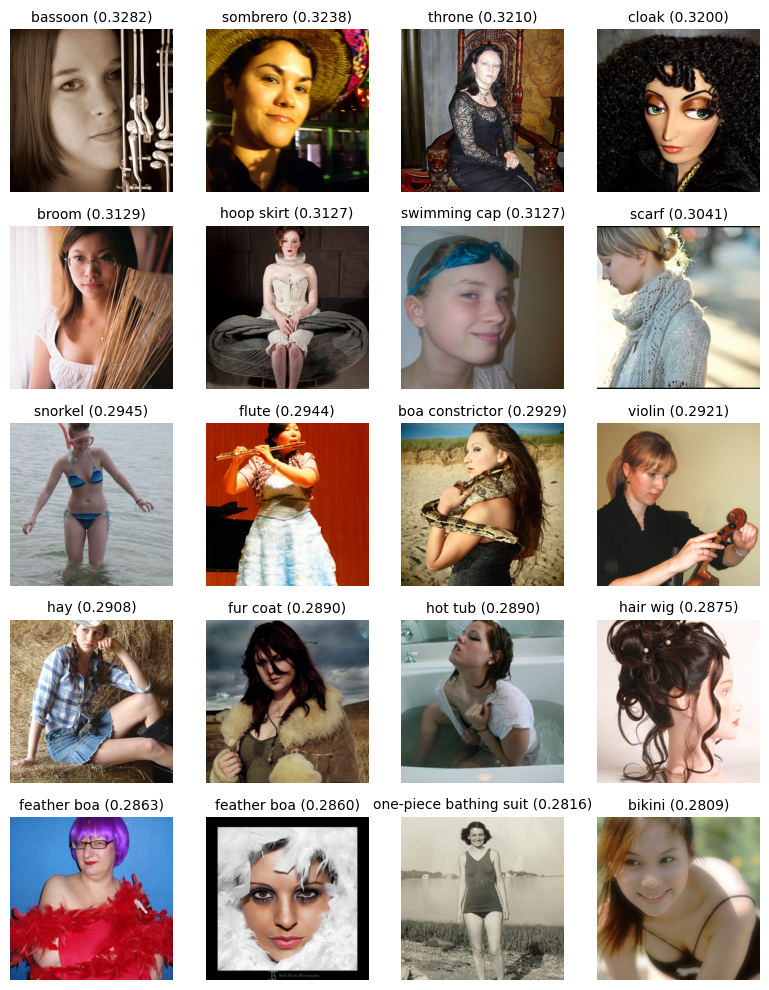

Printing most negative cosine similarity
+----+-------------------------------------------------------+------------+
|    | Text                                                  |   Strength |
|----+-------------------------------------------------------+------------|
|  0 | An image of a man with a slight beard or facial hair. |  -0.208207 |
|  1 | An image of a dad.                                    |  -0.202899 |
|  2 | An image of a man holding a child.                    |  -0.200724 |
|  3 | An image of a grandfather.                            |  -0.200327 |
|  4 | An image of a male with a beard.                      |  -0.190496 |
|  5 | An image of an animal with one large claw.            |  -0.189921 |
|  6 | An image of a male wearing a suit.                    |  -0.189436 |
|  7 | An image of a well-dressed man in a suit.             |  -0.187244 |
|  8 | An image of a father.                                 |  -0.184715 |
|  9 | An image of a male with short hair.     

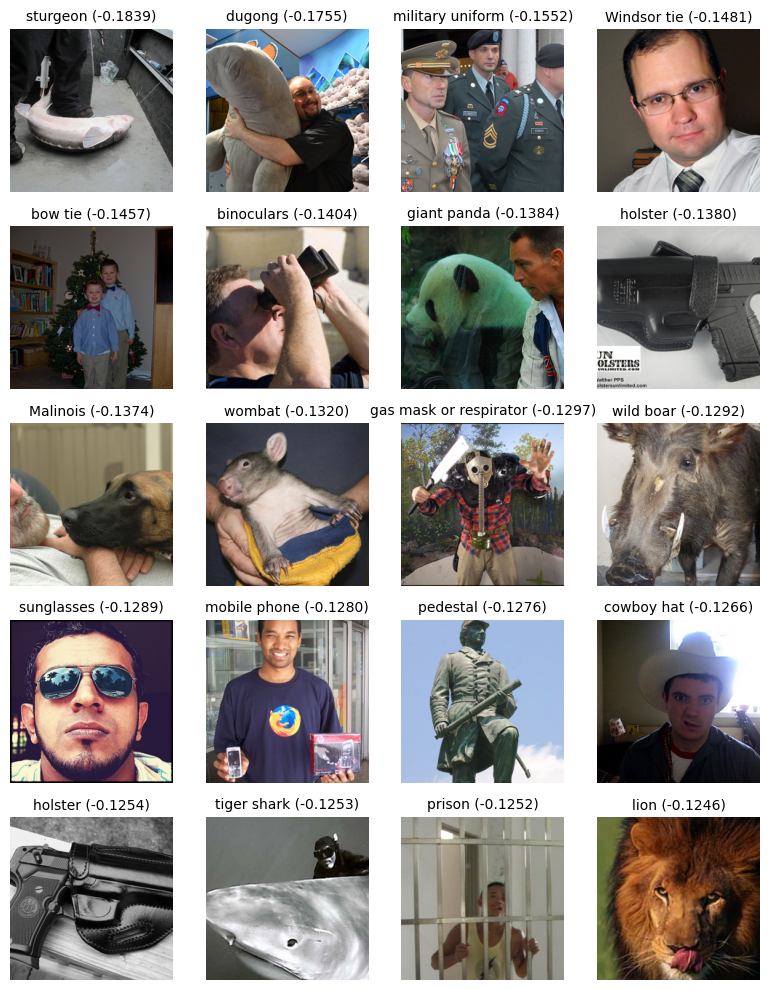

Printing continuous cosine similarity
+----+-------------------------------------------------------------------+-------------+
|    | Text                                                              |    Strength |
|----+-------------------------------------------------------------------+-------------|
|  0 | An image of a man with a slight beard or facial hair.             | -0.208207   |
|  1 | An image of a man smiling broadly.                                | -0.127764   |
|  2 | An image of an animal with long, strong arms.                     | -0.101212   |
|  3 | An image of a vehicle with a large storage compartment.           | -0.0801345  |
|  4 | An image of a powerful predator.                                  | -0.0637055  |
|  5 | An image of a machine used for harvesting crops.                  | -0.0490242  |
|  6 | An image of a small insect.                                       | -0.0361158  |
|  7 | An image of cars in heavy traffic with visible exhaust emissions.

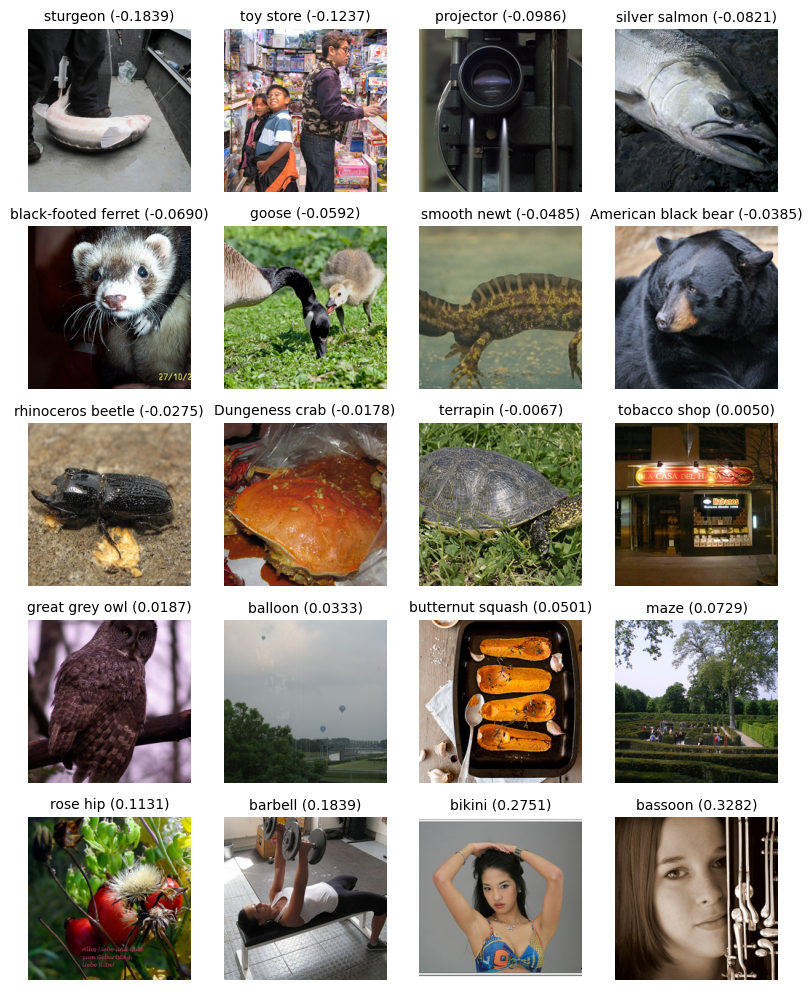

In [8]:
# Info on data
layer = 10
head = 0
princ_comp = 0
# Define the number of top and worst images to look at for each princ_comp
nr_top_imgs = 20  # Number of top elements
nr_worst_imgs = 20  # Number of worst elements
nr_cont_imgs = 20  # Length of continuous elements

visualize_principal_component(layer, head, princ_comp, nr_top_imgs, nr_worst_imgs, nr_cont_imgs, attention_dataset, final_embeddings_images, final_embeddings_texts, seed, imagenet_path, texts_str, imagenet_classes)

# Test accuracy of reconstruction of text and images using only the final embedding and their projections

In [9]:
# Number of top entries to retrieve
top_k = 20
min_heap = []
image = preprocess(Image.open('images/woman.png'))[np.newaxis, :, :, :]  # Add batch dimension
text_query = "An image of a woman."

# Encode the image
prs.reinit()  # Reinitialize the residual stream hook

# Encode the image with no gradient calculation
with torch.no_grad():
      image_emb = model.encode_image(
        image.to(device),
        attn_method='head_no_spatial',
        normalize=True)

      # Encode the text
      text_query_token = tokenizer(text_query).to(device)  # Tokenize the text query
      topic_emb = model.encode_text(text_query_token, normalize=True)  # Encode the text query

# Retrieve data
data = get_data(attention_dataset, -1, skip_final=True)

# Get mean of data and texts
mean_final_images = torch.mean(final_embeddings_images, axis=0)
mean_final_texts = torch.mean(final_embeddings_texts, axis=0)

# Mean center the embeddings
topic_emb -= mean_final_texts
image_emb -= mean_final_images

# Iterate through the attention dataset and reconstruct embeddings
[topic_emb_rec, image_emb_rec], _ = reconstruct_embeddings(data, [topic_emb, image_emb], ["text", "image"])


# Print norms to understand magnitude before normalization
print("Norm of topic_emb_rec before normalization:", topic_emb_rec.norm().item())
print("Norm of image_emb_rec before normalization:", image_emb_rec.norm().item())

# Normalize the reconstructed embeddings so they lie on the unit sphere
topic_emb_rec /= topic_emb_rec.norm(dim=-1, keepdim=True)
image_emb_rec /= image_emb_rec.norm(dim=-1, keepdim=True)
topic_emb /= topic_emb.norm(dim=-1, keepdim=True)
image_emb /= image_emb.norm(dim=-1, keepdim=True)

# Print similarities between original and reconstructed embeddings
print("Cosine similarity between original topic_emb and reconstructed topic_emb_rec:",
      (topic_emb @ topic_emb_rec.T).item())

print("Cosine similarity between original image_emb and reconstructed image_emb_rec:",
      (image_emb @ image_emb_rec.T).item())

# Print cross-similarities to compare text-image embeddings before and after reconstruction
print("Cosine similarity between original topic_emb and original image_emb:",
      (topic_emb @ image_emb.T).item())

print("Cosine similarity between original topic_emb and reconstructed image_emb_rec:",
      (topic_emb @ image_emb_rec.T).item())

print("Cosine similarity between reconstructed topic_emb_rec and original image_emb:",
      (topic_emb_rec @ image_emb.T).item())

print("Cosine similarity between reconstructed topic_emb_rec and reconstructed image_emb_rec:",
      (topic_emb_rec @ image_emb_rec.T).item())


Norm of topic_emb_rec before normalization: 3.777459144592285
Norm of image_emb_rec before normalization: 9.907835006713867
Cosine similarity between original topic_emb and reconstructed topic_emb_rec: 0.8644616007804871
Cosine similarity between original image_emb and reconstructed image_emb_rec: 0.8694302439689636
Cosine similarity between original topic_emb and original image_emb: 0.21131841838359833
Cosine similarity between original topic_emb and reconstructed image_emb_rec: 0.17538633942604065
Cosine similarity between reconstructed topic_emb_rec and original image_emb: 0.24731425940990448
Cosine similarity between reconstructed topic_emb_rec and reconstructed image_emb_rec: 0.23827816545963287


# Query a topic or image and NNs on that

### Define the query and analyze each Principal Component and derive a strength metric for reconstruction of the query-embedding

In [10]:
# Set the model to evaluation mode so that no gradients are computed
model.eval()
query_text = True

# Retrieve an embedding
with torch.no_grad():
    if query_text:
        # If querying by text, define a text prompt and encode it into an embedding
        text_query = "An image of a woman."
        # Tokenize the text query and move it to the device (GPU/CPU)
        text_query_token = tokenizer(text_query).to(device)  
        # Encode the tokenized text into a normalized embedding
        topic_emb = model.encode_text(text_query_token, normalize=True)
    else:
        # If querying by image, load and preprocess the image from disk
        prs.reinit()  # Reinitialize any hooks if required
        text_query = "woman.png"
        image_pil = Image.open(f'images/{text_query}')
        image = preprocess(image_pil)[np.newaxis, :, :, :]  # Add batch dimension
        # Encode the image into a normalized embedding
        topic_emb = model.encode_image(
            image.to(device), 
            attn_method='head_no_spatial',
            normalize=True
        )

### Reconstruct embedding and find contributions from principal components
# Retrieve data
data = get_data(attention_dataset, -1, skip_final=True)

# Get mean of data and texts
mean_final_images = torch.mean(final_embeddings_images, axis=0)
mean_final_texts = torch.mean(final_embeddings_texts, axis=0)

# Mean center the embeddings
mean_final = mean_final_texts if query_text else mean_final_images

# Mean center the embeddings
topic_emb -= mean_final
# Recontruct embedding
[topic_emb_rec], data = reconstruct_embeddings(data, [topic_emb], ["text" if query_text else "image"], return_princ_comp=True)

# Normalize the embeddings
topic_emb_rec /= topic_emb_rec.norm(dim=-1, keepdim=True)
topic_emb /= topic_emb.norm(dim=-1, keepdim=True)

# The maximum reconstruction score is how close the reconstructed embedding is to the original,
# adjusted by the baseline score. This gives a cosine similarity measure.
max_reconstr_score = topic_emb @ topic_emb_rec.T

# Print out the cosine similarity between the original and reconstructed embeddings
print(f"We have a max score of: {(topic_emb @ topic_emb_rec.T).item():.4f}")

We have a max score of: 0.8645


### Use the strength of the previous reconstruction to derive a good enough reconstruction of the query

In [27]:
# Extract relevant details from the top-k principal component entries based on the reconstruction of the query

top_k = 1       # Maximum number of top entries to retrieve
approx = 0.60   # Target approximation threshold for the reconstruction quality

# Initialize a tensor to accumulate the reconstructed topic embedding from selected principal components
topic_emb_rec_act = torch.zeros_like(topic_emb)

### Extract relevant details from the top k entries
data = sort_data_by(data, "cosine_princ_comp") 
top_k_entries = top_data(data, top_k)

top_k_details = reconstruct_top_embedding(top_k_entries, topic_emb, "text" if query_text else "image", max_reconstr_score, top_k, approx)

# Convert the collected principal component details into a DataFrame for easy processing
print(f"Currently querying the topic: {text_query}")
print_data(top_k_details, is_cosine_present=True)


Reconstruction Quality Report:
- Maximum achievable reconstruction score: 0.8645
- Current reconstruction score: 0.1778
  This corresponds to 20.57% of the maximum possible score.

The reconstruction was performed using the top 1 principal component(s).
 Increasing this number may improve the reconstruction score.


Currently querying the topic: An image of a woman.
Layer 10, Head 0, Principal Component 0, Variance 1.279, Relative Variance 4.402, Head Rank 64
Cosine of the Topic with the Principal Component 0.2136
+----+-----------------------------------------------+---------------------+-------------------------------------------------------+---------------------+
|    | Positive                                      |   Positive_Strength | Negative                                              |   Negative_Strength |
|----+-----------------------------------------------+---------------------+-------------------------------------------------------+---------------------|
|  0 | An image

### Prepare scores of images and texts 

In [ ]:
# Visualize ds
ds_vis = create_dataset_imagenet(imagenet_path, visualization_preprocess, samples_per_class=3, tot_samples_per_class=50, seed=seed)
# Initialize arrays to store the top and lowest scores for each search head.
scores_array_images = np.empty(
    final_embeddings_images.shape[0], 
    dtype=[('score', 'f4'), ('img_index', 'i4')]
)
scores_array_texts = np.empty(
    final_embeddings_texts.shape[0], 
    dtype=[('score', 'f4'), ('txt_index', 'i4')]
)

# Create arrays of indexes for referencing images and texts.
indexes_images = np.arange(0, final_embeddings_images.shape[0], 1) 
indexes_texts = np.arange(0, final_embeddings_texts.shape[0], 1) 


# Get mean of data and texts
mean_final_images = torch.mean(final_embeddings_images, axis=0)
mean_final_texts = torch.mean(final_embeddings_texts, axis=0)

images_centered = final_embeddings_images - mean_final_images
texts_centered = final_embeddings_texts - mean_final_texts

# Recontruct embedding
[texts_rec, images_rec], _ = reconstruct_embeddings(top_k_details, [texts_centered, images_centered], ["text", "image"], return_princ_comp=False)

# Normalize the reconstructed embeddings so that their magnitude is 1. 
texts_rec /= texts_rec.norm(dim=-1, keepdim=True)
images_rec /= images_rec.norm(dim=-1, keepdim=True)

# Compute the similarity scores between the reconstructed embeddings (images or texts) and the original query embedding.
# The dot product gives a similarity measure, which we store in the scores arrays along with the index.
scores_array_images["score"] = (images_rec @ topic_emb.detach().squeeze()).numpy()
scores_array_images["img_index"] = indexes_images

scores_array_texts["score"] = (texts_rec @ topic_emb.detach().squeeze()).numpy()
scores_array_texts["txt_index"] = indexes_texts

### Visualize

----Decomposition for text: 'An image of a woman.'----
Layer 10, Head 0, Principal Component 0, Variance 1.279, Relative Variance 4.402, Head Rank 64
Cosine of the Topic with the Principal Component 0.2136
+----+-----------------------------------------------+---------------------+-------------------------------------------------------+---------------------+
|    | Positive                                      |   Positive_Strength | Negative                                              |   Negative_Strength |
|----+-----------------------------------------------+---------------------+-------------------------------------------------------+---------------------|
|  0 | An image of a woman.                          |            0.421678 | An image of a man with a slight beard or facial hair. |           -0.208207 |
|  1 | An image of an elegant woman.                 |            0.388502 | An image of a dad.                                    |           -0.202899 |
|  2 | An image of 

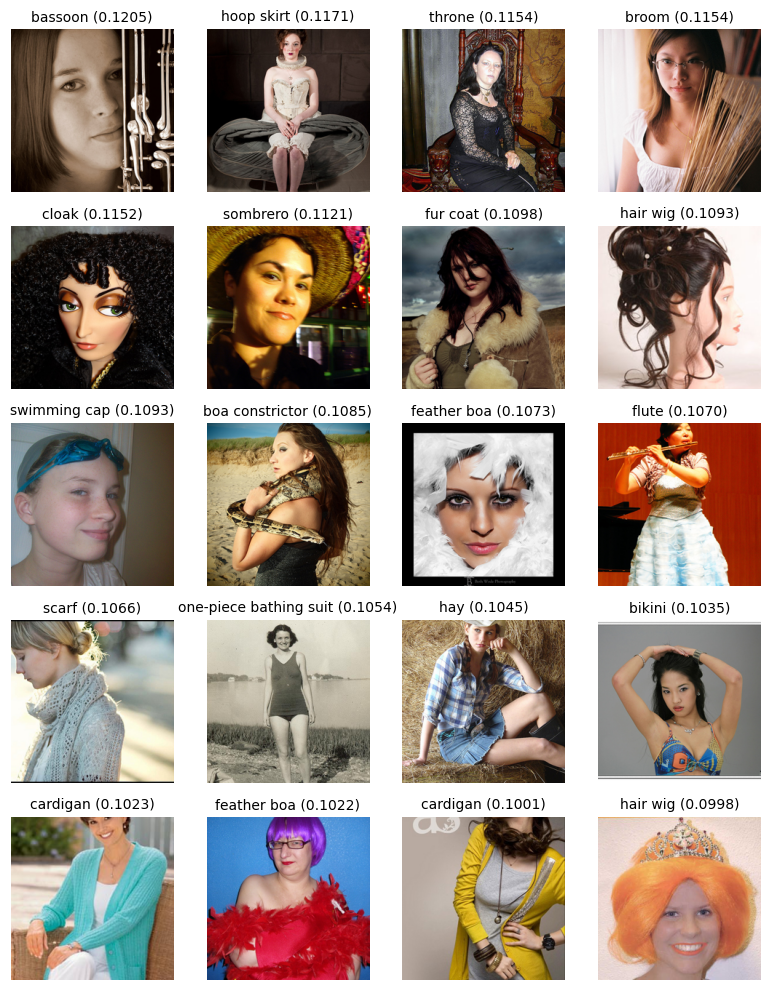

Printing most negative cosine similarity
+----+-------------------------------------------------------------+------------+
|    | Text                                                        |   Strength |
|----+-------------------------------------------------------------+------------|
|  0 | An image of a man holding a child.                          | -0.0588044 |
|  1 | An image of a man with a slight beard or facial hair.       | -0.0550418 |
|  2 | An image of a man with children.                            | -0.0549251 |
|  3 | An image of a man reading a story to kids.                  | -0.0525769 |
|  4 | An image of a father playing with children.                 | -0.0518066 |
|  5 | An image of a grandfather.                                  | -0.0515292 |
|  6 | An image of a man with a slightly receding hairline.        | -0.0509699 |
|  7 | An image of a dad.                                          | -0.0499921 |
|  8 | An image of a hound with a deep chest.            

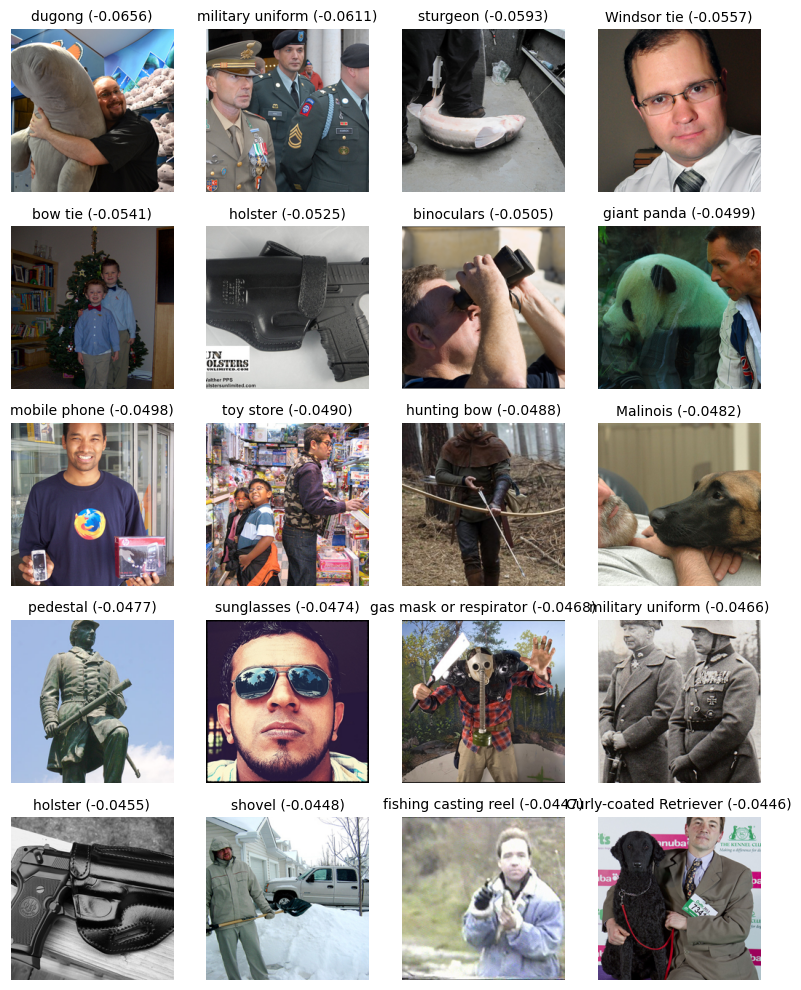

Printing continuous cosine similarity
+----+------------------------------------------------------+-------------+
|    | Text                                                 |    Strength |
|----+------------------------------------------------------+-------------|
|  0 | An image of a man holding a child.                   | -0.0588044  |
|  1 | An image of a cow standing in a barn.                | -0.0330761  |
|  2 | An image of a high-ranking military officer.         | -0.0259786  |
|  3 | An image of cars moving on a wide road.              | -0.0207899  |
|  4 | An image of a bird with a strong beak.               | -0.0166593  |
|  5 | An image of an elongated insect.                     | -0.0128622  |
|  6 | An image of a small engine component.                | -0.00952959 |
|  7 | An image of a large, elevated passageway.            | -0.00655984 |
|  8 | An image of a fungal growth.                         | -0.00387215 |
|  9 | An image of colorful light spreading from a

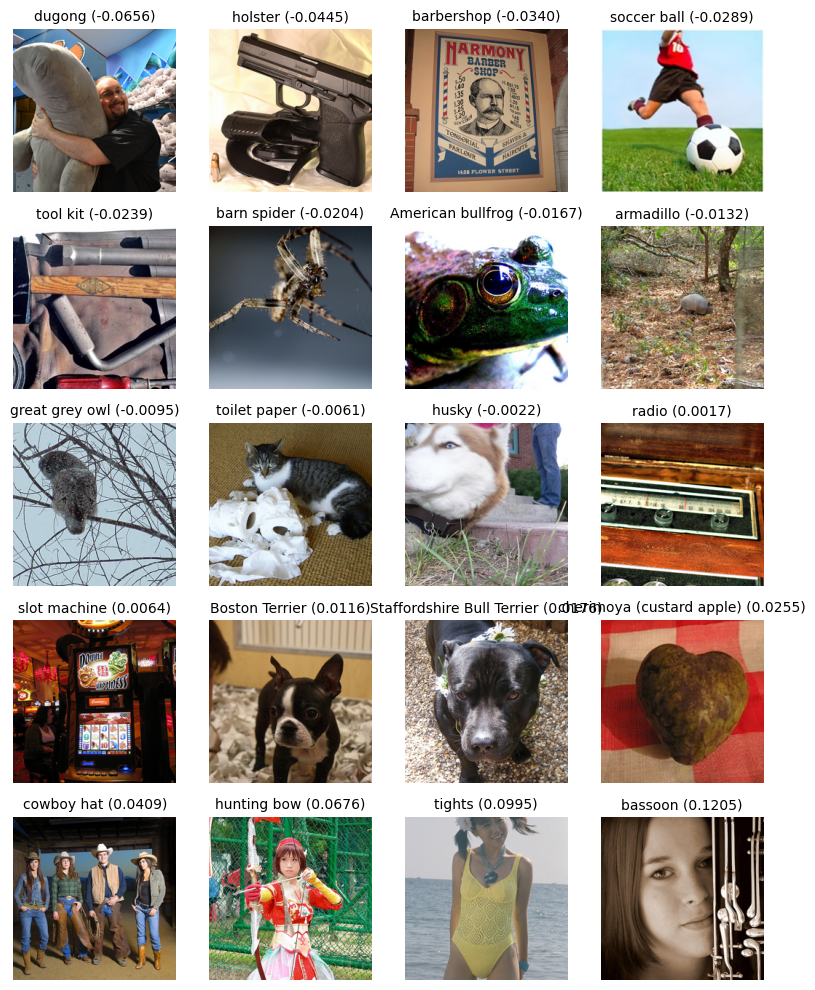

In [31]:
# Define the number of top and worst images to look at for each princ_comp
nr_top_imgs = 20  # Number of top elements
nr_worst_imgs = 20  # Number of worst elements
nr_cont_imgs = 20  # Length of continuous elements

dbs = create_dbs(scores_array_images, scores_array_texts, nr_top_imgs, nr_worst_imgs, nr_cont_imgs)

visualize_dbs(top_k_details, dbs, ds_vis, texts_str, imagenet_classes, text_query)

# Evaluate classification using reconstruction

In [32]:
def test_accuracy(prediction, labels, label="Classifier"):
    """
    Calculate the accuracy of the model's predictions.
    """
    accuracy, indexes = accuracy_correct(prediction, labels)
    accuracy_pred = accuracy[0] * 100
    print(f"For the approach {label}, the accuracy is: {accuracy_pred:3f}%")
    return accuracy_pred, indexes[0]

def print_wrong_elements(indexes_1, indexes_2):
    # TODO: Hardcoded for ImageNet
    # Retrieve the labels of the dataset. 
    # This is hardcoded for ImageNet where nr_classes is the number of classes (usually 1000).
    nr_samples = torch.arange(1000)
    classes_indexes = nr_samples.repeat_interleave(3)
    class_labels = np.array([imagenet_classes[i] for i in classes_indexes])
    # Determine which elements differ between the two reconstructions
    wrong_elements = np.array(~(indexes_1 == indexes_2))

    print(f"Number of elements with different results between the two reconstruction methods: {len(class_labels[wrong_elements])}")
    # Track occurrences
    label_count = defaultdict(int)
    output_set = set()

    # Iterate through mask and labels
    for idx, is_wrong in enumerate(wrong_elements):
        if is_wrong:
            label = class_labels[idx]
            label_count[label] += 1

    # Sort the set by nr_of_prev_occurrences in descending order
    sorted_output = sorted(label_count.items(), key=lambda x: x[1], reverse=True)

    # Print the result
    print(f"The wrong elements labels are: {sorted_output}")

In [33]:
# Print shapes of the tensors for debugging purposes:
# attns_: attention activations
# mlps_: MLP activations
# classifier_: classifier weights
# labels_: ground truth labels
print(attns_.shape, mlps_.shape, classifier_.shape, labels_.shape)


# Baseline accuracy computation:
baseline = attns_.sum(axis=(1, 2)) + mlps_.sum(axis=1)
test_accuracy(baseline @ classifier_, labels_, label="Baseline")

# Test accuracy of mean centered data with mean centered text
mean_centered_data = attns_.sum(axis=(1, 2)) + mlps_.sum(axis=1) - mean_final_images
mean_centered_data /= mean_centered_data.norm(dim=-1, keepdim=True)
mean_centered_classifier_ = classifier_ - mean_final_texts.unsqueeze(-1)
mean_centered_classifier_ /= mean_centered_classifier_.norm(dim=-1, keepdim=True)

test_accuracy(mean_centered_data @ mean_centered_classifier_, labels_, label="Mean centered data with mean centered text")

# Test accuracy of mean centered data with original text
mean_centered_data = attns_.sum(axis=(1, 2)) + mlps_.sum(axis=1) - mean_final_images
mean_centered_data /= mean_centered_data.norm(dim=-1, keepdim=True)
mean_centered_data += mean_final_texts
mean_centered_data /= mean_centered_data.norm(dim=-1, keepdim=True)
test_accuracy(mean_centered_data @ classifier_, labels_, label="Mean centered data with original text")

# We now attempt a "mean ablation" approach for attention
layers_to_ablate = 4
last = attns_.shape[1] - layers_to_ablate
no_heads_attentions = attns_.sum(axis=(2))  # Sum over heads dimension
# Replace attention activations until 'last' layer with their average, while keeping later layers intact.
current_model = (torch.mean(no_heads_attentions[:, :last + 1], axis=0).sum(0)
                 + no_heads_attentions[:, last + 1:].sum(1)) + mlps_.sum(axis=1) 
_, indexes_mean_ablate = test_accuracy(current_model @ classifier_, labels_, label=f"Mean ablation from layer {last} until layer {attns_.shape[1]}")

torch.Size([3000, 12, 12, 512]) torch.Size([3000, 13, 512]) torch.Size([512, 1000]) torch.Size([3000])
For the approach Baseline, the accuracy is: 67.233333%
For the approach Mean centered data with mean centered text, the accuracy is: 62.133333%
For the approach Mean centered data with original text, the accuracy is: 48.933333%
For the approach Mean ablation from layer 8 until layer 12, the accuracy is: 65.900000%


In [34]:
current_mean_ablation_per_head_sum = torch.mean(no_heads_attentions[:, :last + 1], axis=0).sum(0)
final_embeddings_images_rec_embed = torch.zeros_like(final_embeddings_images)
final_embeddings_images_rec_attns = torch.zeros_like(final_embeddings_images)

# Open the attention dataset to retrieve projection matrices and mean values
image_emb_cent_embed = final_embeddings_images - mean_final_images

with open(attention_dataset, "r") as json_file:
    for line in json_file:
        entry = json.loads(line)
        # If this entry is the final embedding entry (head == -1), skip it.
        if entry["head"] == -1:
            last_line = entry
            continue

        project_matrix = torch.tensor(entry["project_matrix"])
        vh = torch.tensor(entry["vh"])

        # Reconstruct the image embeddings using final embeddings:
        # Center them by subtracting mean attention values, project them through vh, 
        # apply project_matrix and vh again, then add mean values back.
        final_embeddings_images_rec_embed += (image_emb_cent_embed) @ vh.T @ project_matrix @ vh
        # Reconstruct the image embeddings using attention activations:
        # Similar process, but start from attns_ for the given layer/head.
        image_emb_cent_attns = attns_[:, entry["layer"], entry["head"], :] - torch.tensor(entry["mean_values_att"])
        final_embeddings_images_rec_attns += (image_emb_cent_attns) @ vh.T @ project_matrix @ vh + torch.tensor(entry["mean_values_att"]) 


final_embeddings_images_rec_embed += mean_final_images
# Evaluate accuracy using the reconstructed embeddings from the final embedding approach
current_model = (mlps_.sum(axis=1) + current_mean_ablation_per_head_sum + final_embeddings_images_rec_embed)
_, indexes_approx_final = test_accuracy(current_model @ mean_centered_classifier_, labels_, label=f"Approximation with final embeddings")

# Evaluate accuracy using the reconstructed embeddings from the attention activations approach
current_model = (mlps_.sum(axis=1) + current_mean_ablation_per_head_sum + final_embeddings_images_rec_attns)
_, indexes_approx_activ = test_accuracy(current_model @ classifier_, labels_, label=f"Approximation with attention activations")

print_wrong_elements(indexes_mean_ablate, indexes_approx_activ)

For the approach Approximation with final embeddings, the accuracy is: 60.266667%
For the approach Approximation with attention activations, the accuracy is: 65.533333%
Number of elements with different results between the two reconstruction methods: 137
The wrong elements labels are: [('nematode', 2), ('chiton', 2), ('dunlin', 2), ('Dobermann', 2), ('Siberian Husky', 2), ('dung beetle', 2), ('Alpine ibex', 2), ('oboe', 2), ('parallel bars', 2), ('spotlight', 2), ('scarf', 2), ('traffic or street sign', 2), ('cliff', 2), ('axolotl', 1), ('frilled-necked lizard', 1), ('European green lizard', 1), ('smooth green snake', 1), ('water snake', 1), ('scorpion', 1), ('yellow garden spider', 1), ('centipede', 1), ('ruffed grouse', 1), ('hummingbird', 1), ('goose', 1), ('Dungeness crab', 1), ('red king crab', 1), ('crayfish', 1), ('isopod', 1), ('oystercatcher', 1), ('Bloodhound', 1), ('Treeing Walker Coonhound', 1), ('Otterhound', 1), ('Scottish Deerhound', 1), ('Norfolk Terrier', 1), ('Norwich

In [35]:
# Next, we calculate scores for each principal component (PC) while ignoring query info.
# We do this by reconstructing embeddings from the principal components alone, both from 
# the final embeddings perspective and the attention activations perspective.

final_embeddings_images_rec_embed_topic = torch.zeros_like(final_embeddings_images)
final_embeddings_images_rec_attns_topic = torch.zeros_like(final_embeddings_images)

image_emb_cent_embed = final_embeddings_images - mean_final_images

for entry in top_k_details:
    # Reconstruct embeddings focusing on each principal component:
    # 1. Start from the final embeddings, center them, and extract the component of interest.
    vh = torch.tensor(entry["vh"])
    project_matrix = torch.tensor(entry["project_matrix"])
    princ_comp = torch.tensor(entry["princ_comp"])
    projection_image_embed = image_emb_cent_embed @ vh.T
    mask_images_embed = torch.zeros_like(projection_image_embed)
    mask_images_embed[:, princ_comp] = projection_image_embed[:, princ_comp]
    final_embeddings_images_rec_embed_topic += mask_images_embed @ project_matrix @ vh

    # Repeat for attention-based activations:
    mean_values_att = torch.tensor(entry["mean_values_att"])
    image_emb_cent_attns = attns_[:, entry["layer"], entry["head"], :] - mean_values_att
    projection_images_attns = image_emb_cent_attns @ vh.T
    mask_images_attns = torch.zeros_like(projection_images_attns)
    mask_images_attns[:, princ_comp] = projection_images_attns[:, princ_comp]
    final_embeddings_images_rec_attns_topic += mask_images_attns @ project_matrix @ vh + torch.tensor(entry["mean_values_att"])


final_embeddings_images_rec_embed_topic += mean_final_images

# Compute accuracy using the reconstruction from final embeddings, ignoring the query information.
current_model = mlps_.sum(axis=1) + current_mean_ablation_per_head_sum + final_embeddings_images_rec_embed - final_embeddings_images_rec_embed_topic
_, indexes_approx_final_rem = test_accuracy(current_model @ classifier_, labels_, label=f"Approximation with current topic final embeddings")
print_wrong_elements(indexes_approx_final, indexes_approx_final_rem)

# Compute accuracy using the reconstruction from attention activations, also ignoring the query information.
current_model = mlps_.sum(axis=1) + current_mean_ablation_per_head_sum + final_embeddings_images_rec_attns - final_embeddings_images_rec_attns_topic
_, indexs_approx_activ_rem = test_accuracy(current_model @ classifier_, labels_, label=f"Approximation with current topic final embeddings")
print_wrong_elements(indexes_approx_activ, indexs_approx_activ_rem)

For the approach Approximation with current topic final embeddings, the accuracy is: 59.666667%
Number of elements with different results between the two reconstruction methods: 218
The wrong elements labels are: [('sturgeon', 3), ('beaker', 3), ('library', 3), ('agama', 2), ('scorpion', 2), ('tusker', 2), ('Dandie Dinmont Terrier', 2), ('English Springer Spaniel', 2), ('gazelle', 2), ('macaque', 2), ('titi monkey', 2), ('balance beam', 2), ('dome', 2), ('slip-on shoe', 2), ('megalith', 2), ('parallel bars', 2), ('radiator', 2), ('sandal', 2), ('scabbard', 2), ('trombone', 2), ('great white shark', 1), ('hammerhead shark', 1), ('stingray', 1), ('junco', 1), ('jay', 1), ('fire salamander', 1), ('smooth newt', 1), ('American bullfrog', 1), ('tree frog', 1), ('mud turtle', 1), ('frilled-necked lizard', 1), ('alligator lizard', 1), ('chameleon', 1), ('Nile crocodile', 1), ('triceratops', 1), ('worm snake', 1), ('garter snake', 1), ('vine snake', 1), ('boa constrictor', 1), ('sidewinder rat